##ECSE 415 - Assignment 2: Feature Extraction

#Theo Ghanem 260972584

#SIFT Features

##2.1 Sift in a nutshell

The four main actions of the SIFT (xxx) algorithm:


##2.2 SIFT between two different pictures

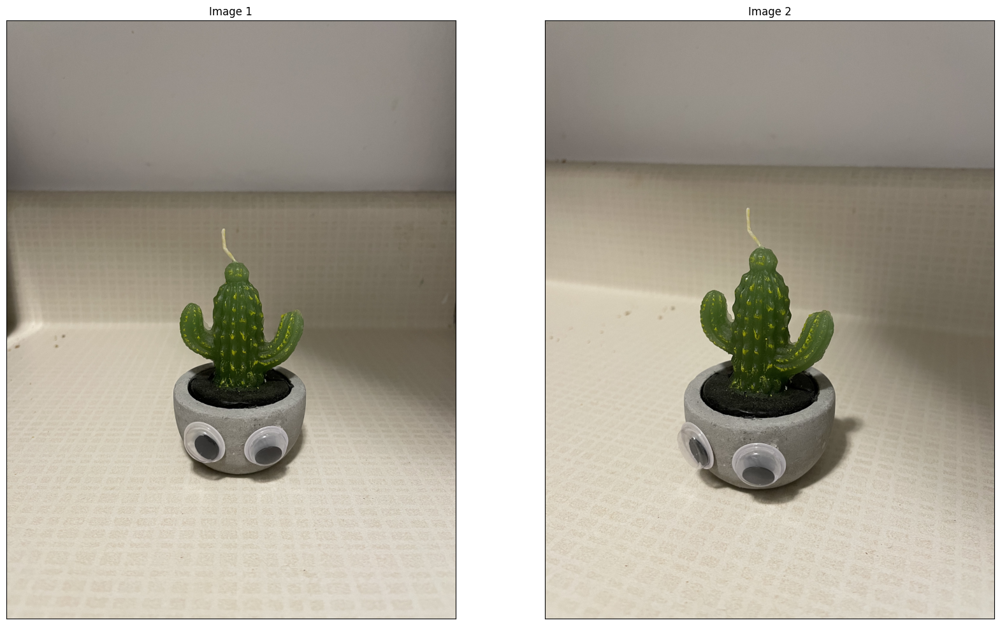

In [65]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

# from google.colab import drive
# drive.mount('/content/drive')
# 
# path = '/content/drive/My Drive/ECSE415_computer_vision/A1/'
path = '/Users/theog/Documents/CodingProjects/ECSE415_Computer_Vision/Assignments/A2/A2-W24-images/Data/'

#Load the 2 images
image_1 = cv2.imread(path+'Q2/Image1.png')
image_2 = cv2.imread(path+'Q2/Image2.png')
# 
# image_1 = cv2.resize(image_1, None, fx = 0.75, fy = 0.75)
# image_2 = cv2.resize(image_2, None, fx = 0.75, fy = 0.75)


image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB)
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)

#Display images
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(image_1) # 2x2 subplot, 1 selected
plt.title("Image 1"), plt.xticks([]), plt.yticks([]) # title and remove the axis ticks
plt.subplot(122), plt.imshow(image_2) # 2x2 subplot, 2 selected
plt.title("Image 2"), plt.xticks([]), plt.yticks([])
plt.show()


### 1. Compute SIFT keypoints for image_1 and image_2.

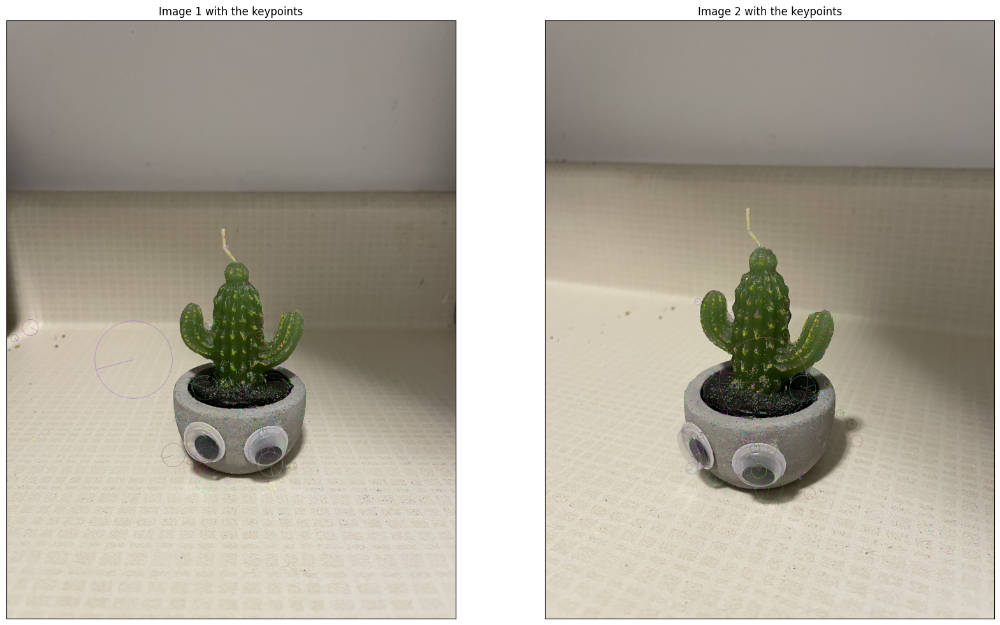

In [66]:

# compute SIFT keypoints for both images (from tutorial 4)
sift_obj = cv2.SIFT_create()
keypoints_l, descriptors_l = sift_obj.detectAndCompute(image_1, None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(image_2, None)

# display keypoints
image_1 = cv2.drawKeypoints(image_1, keypoints_l, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image_2 = cv2.drawKeypoints(image_2, keypoints_r, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#Display images
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(image_1) # 2x2 subplot, 1 selected
plt.title("Image 1 with the keypoints"), plt.xticks([]), plt.yticks([]) # title and remove the axis ticks
plt.subplot(122), plt.imshow(image_2) # 2x2 subplot, 2 selected
plt.title("Image 2 with the keypoints"), plt.xticks([]), plt.yticks([])
plt.show()


### 2. Match all keypoints between two images using a brute-force method.

In [67]:
# create a BFMatcher object which will match up the SIFT features
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors_l,descriptors_r)

### 3. Sort the matching keypoints according to the matching distance.

In [68]:
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
image_3 = cv2.drawMatches(image_1,keypoints_l,image_2,keypoints_r, matches[:10], None, flags=2)

### 4. Display the top ten matched keypoints.

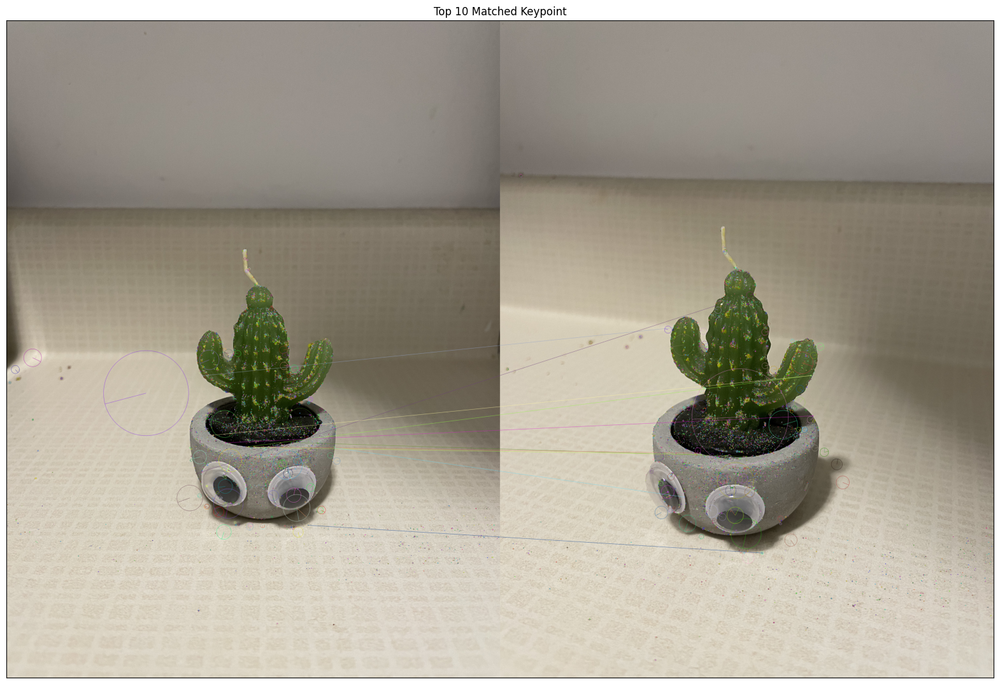

In [69]:
plt.figure(figsize=(20, 20))
plt.imshow(image_3)
plt.title('Top 10 Matched Keypoint'), plt.xticks([]), plt.yticks([])
plt.show()

### 5. Plot the matching distance for the top 100 matched keypoints. Plot the indices of keypoints on the x-axis and the corresponding matching distance on the y-axis.

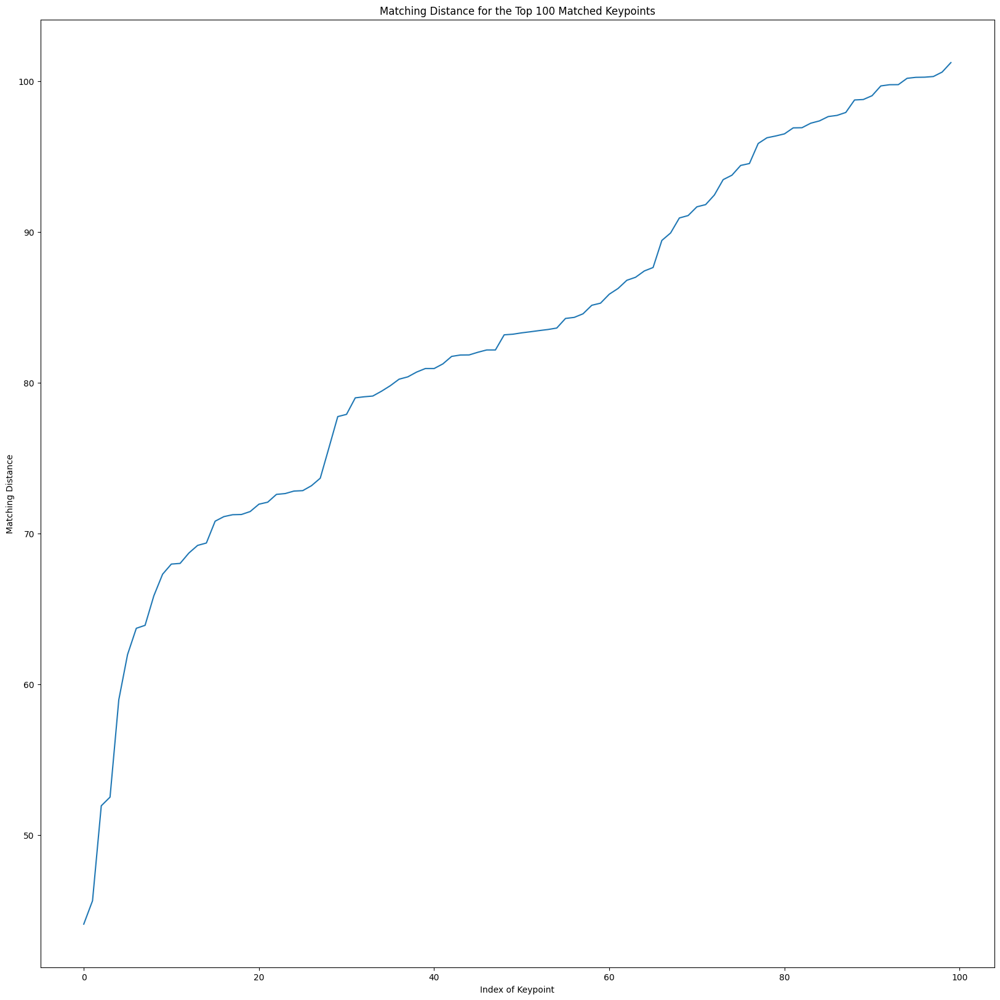

In [70]:
distances = [match.distance for match in matches[:100]]

plt.figure(figsize=(20, 20))
plt.plot(range(100), distances)
plt.title('Matching Distance for the Top 100 Matched Keypoints')
plt.xlabel('Index of Keypoint')
plt.ylabel('Matching Distance')
plt.show()

##2.3  Invariance Under Scale

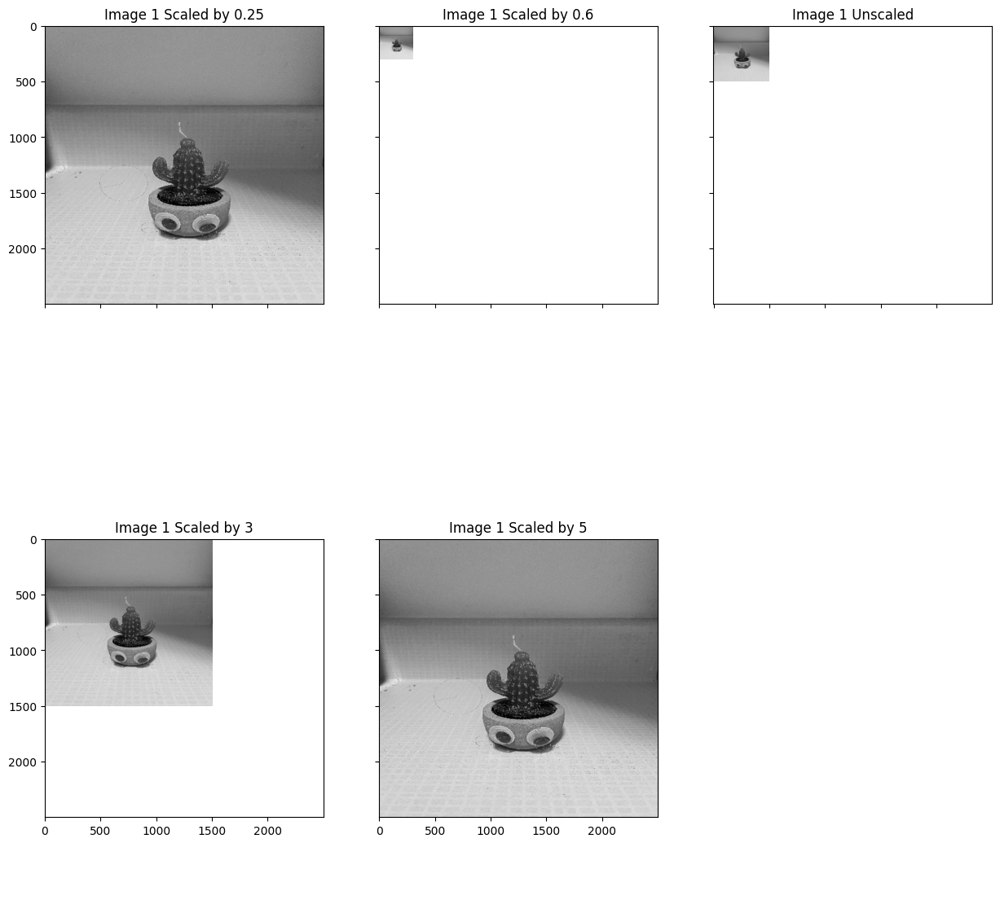

In [71]:
image_1=cv2.resize(image_1, (500,500))
image_2=cv2.resize(image_2, (500,500))

image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY)
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

# compute SIFT keypoints for image 1 (from tutorial 4)
sift_obj = cv2.SIFT_create()
keypoints_l, descriptors_l = sift_obj.detectAndCompute(image_1, None)

# scale image 1 by a factor of (0.25, 0.6, 3, 5)
image_1_25 = cv2.resize(image_1, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_CUBIC)
image_1_6 = cv2.resize(image_1, None, fx=0.6, fy=0.6, interpolation=cv2.INTER_CUBIC)
image_1_3 = cv2.resize(image_1, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
image_1_5 = cv2.resize(image_1, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)

#display scaled images on the same x and y axis:
fig, axs = plt.subplots(2, 3, figsize=(15, 15), sharex=True, sharey=True)
axs[0, 0].imshow(image_1_5, cmap='gray')
axs[0, 0].set_title('Image 1 Scaled by 0.25')
axs[0, 1].imshow(image_1_6, cmap='gray')
axs[0, 1].set_title('Image 1 Scaled by 0.6')
axs[0, 2].imshow(image_1, cmap='gray')
axs[0, 2].set_title('Image 1 Unscaled')
axs[1, 0].imshow(image_1_3, cmap='gray')
axs[1, 0].set_title('Image 1 Scaled by 3')
axs[1, 1].imshow(image_1_5, cmap='gray')
axs[1, 1].set_title('Image 1 Scaled by 5')
axs[1, 2].axis('off')
plt.show()

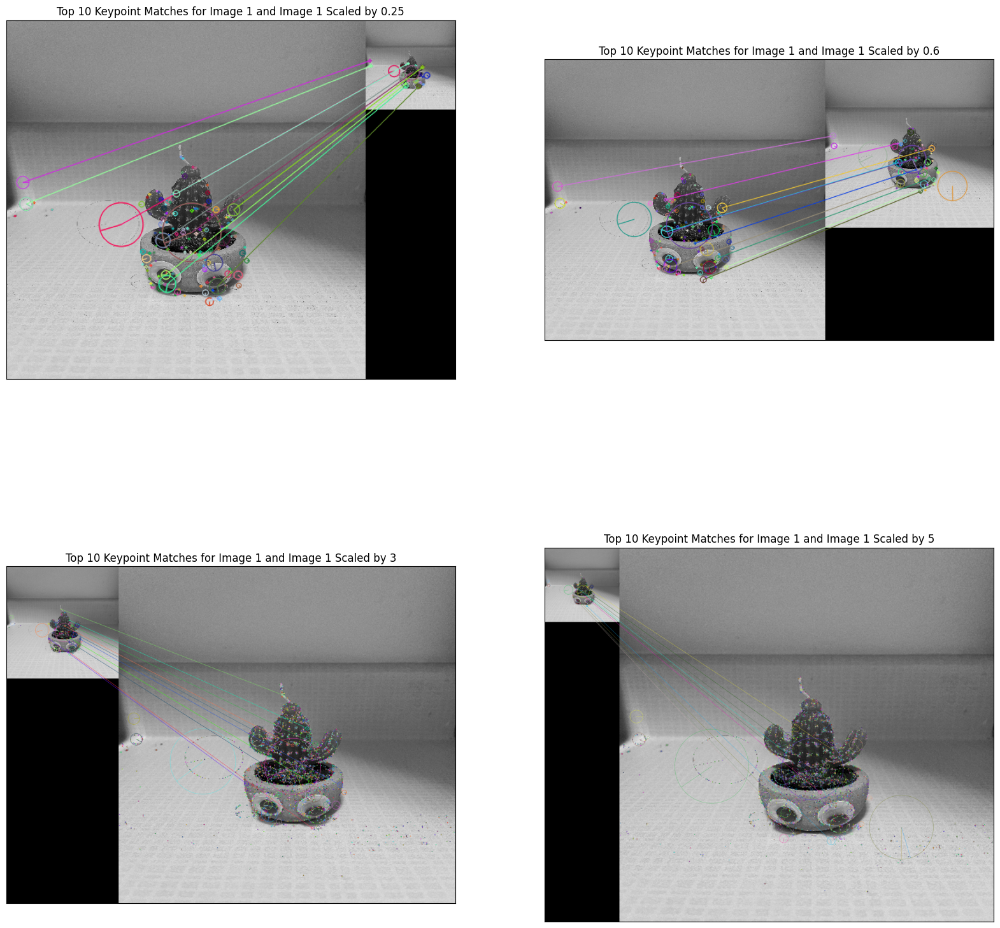

In [72]:

# next we compute SIFT keypoints for scaled images
keypoints_25, descriptors_25 = sift_obj.detectAndCompute(image_1_25, None)
keypoints_6, descriptors_6 = sift_obj.detectAndCompute(image_1_6, None)
keypoints_3, descriptors_3 = sift_obj.detectAndCompute(image_1_3, None)
keypoints_5, descriptors_5 = sift_obj.detectAndCompute(image_1_5, None)

# Using a brute force matcher we match all keypoints between image 1 and scaled images 
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches_25 = bf.match(descriptors_l,descriptors_25)
matches_6 = bf.match(descriptors_l,descriptors_6)
matches_3 = bf.match(descriptors_l,descriptors_3)
matches_5 = bf.match(descriptors_l,descriptors_5)

# Sort them in the order of their distance.
matches_25 = sorted(matches_25, key = lambda x:x.distance)
matches_6 = sorted(matches_6, key = lambda x:x.distance)
matches_3 = sorted(matches_3, key = lambda x:x.distance)
matches_5 = sorted(matches_5, key = lambda x:x.distance)

# Draw first 10 matches.
image_1_25 = cv2.drawMatches(image_1,keypoints_l,image_1_25,keypoints_25,matches_25[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_6 = cv2.drawMatches(image_1,keypoints_l,image_1_6,keypoints_6,matches_6[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_3 = cv2.drawMatches(image_1,keypoints_l,image_1_3,keypoints_3,matches_3[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_5 = cv2.drawMatches(image_1,keypoints_l,image_1_5,keypoints_5,matches_5[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

#Display images
plt.figure(figsize=(20, 20))
plt.subplot(221), plt.imshow(image_1_25)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Scaled by 0.25'), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(image_1_6)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Scaled by 0.6'), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(image_1_3)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Scaled by 3'), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(image_1_5)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Scaled by 5'), plt.xticks([]), plt.yticks([])
plt.show()


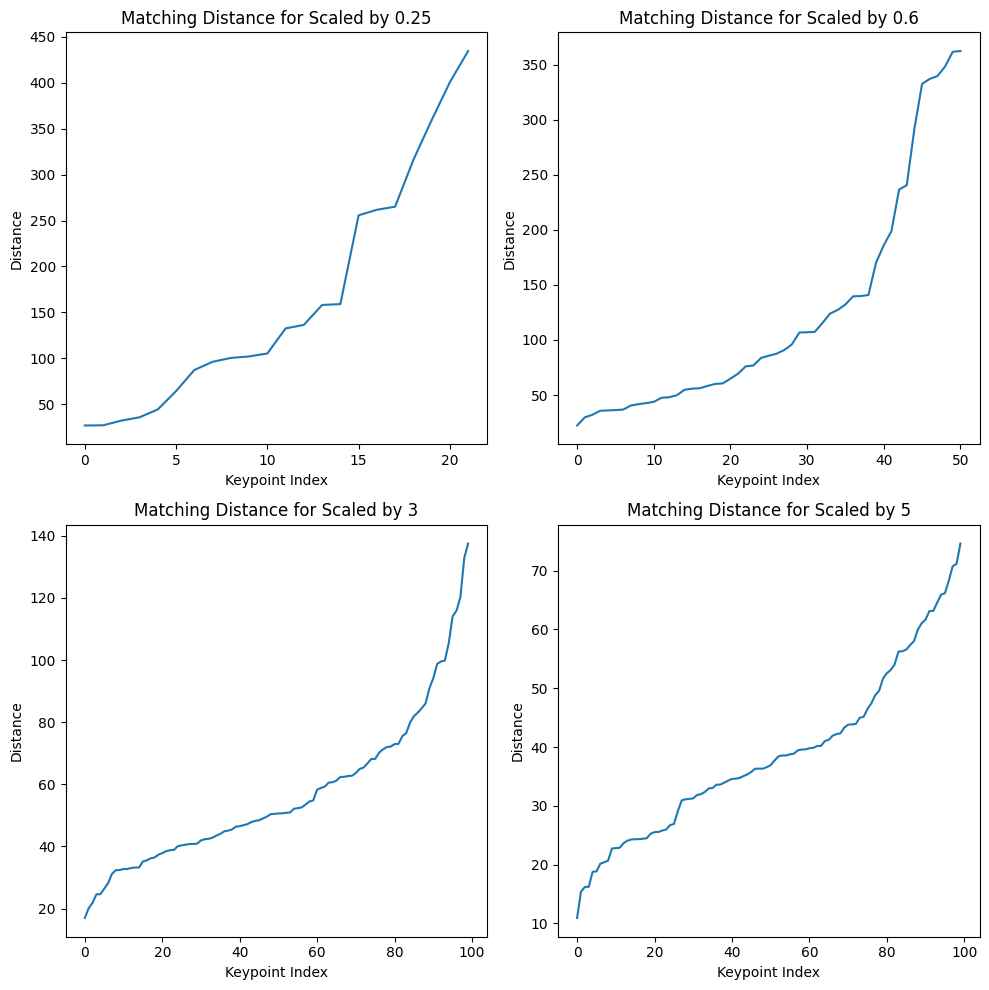

In [85]:
# create a list of tuples containing the scale factors and the corresponding matches
scale_factors_and_matches = [
  (0.25, [match.distance for match in matches_25[:100]]),
  (0.6, [match.distance for match in matches_6[:100]]),
  (3, [match.distance for match in matches_3[:100]]),
  (5, [match.distance for match in matches_5[:100]])
]

plt.figure(figsize=(10, 10))

# iterate over the list to create the subplots
for i, (scale_factor, distances) in enumerate(scale_factors_and_matches, start=1):
  plt.subplot(220 + i)
  plt.plot(range(len(distances)), distances)
  plt.title(f'Matching Distance for Scaled by {scale_factor}')
  plt.xlabel('Keypoint Index')
  plt.ylabel('Distance')

plt.tight_layout()
plt.show()

### 8. Discuss the trend in the plotted results. What is the effect of increasing the scale on the matching distance? Explain. 

From the four plots above we notice a very minor change in matched distance as the scale increases, which is expected since the SIFT algorithm is not impacted by scale since it uses the gradient of the image to find keypoints and their descriptors. The gradient is not affected by scale, so the matching distance remains constant. Hence even with larger scales, many keypoints are correctly matched, while decreasing the distance.

##2.4  Invariance Under Rotation

### 1. Rotate image_1 at the angle of (30, 75, 90, 180). Display rotated images.

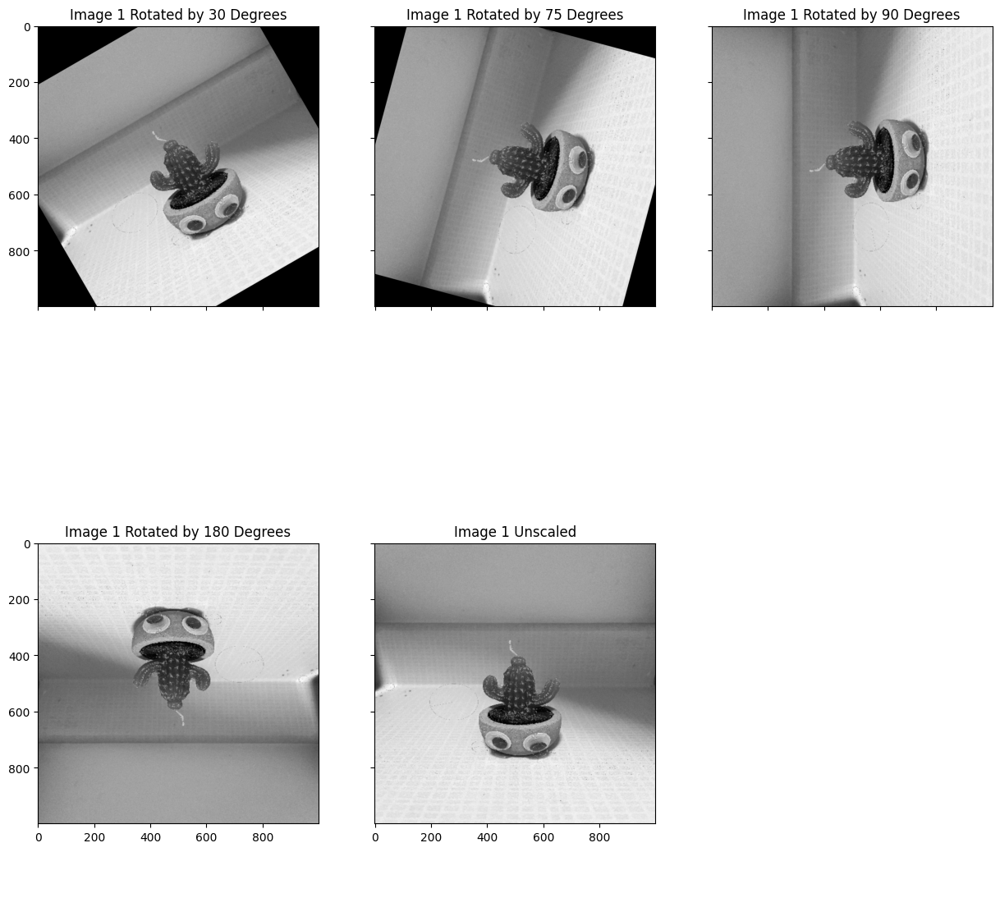

In [79]:
#Rotate image_1 at the angle of (30, 75, 90, 180). Display rotated images
#using cv2.getRotationMatrix2D() and cv2.warpAffine() functions
image_1_rotated_30_degrees = cv2.warpAffine(image_1, cv2.getRotationMatrix2D((image_1.shape[1]/2, image_1.shape[0]/2), 30, 1), (image_1.shape[1], image_1.shape[0]))
image_1_rotated_75_degrees = cv2.warpAffine(image_1, cv2.getRotationMatrix2D((image_1.shape[1]/2, image_1.shape[0]/2), 75, 1), (image_1.shape[1], image_1.shape[0]))
image_1_rotated_90_degrees = cv2.warpAffine(image_1, cv2.getRotationMatrix2D((image_1.shape[1]/2, image_1.shape[0]/2), 90, 1), (image_1.shape[1], image_1.shape[0]))
image_1_rotated_180_degrees = cv2.warpAffine(image_1, cv2.getRotationMatrix2D((image_1.shape[1]/2, image_1.shape[0]/2), 180, 1), (image_1.shape[1], image_1.shape[0]))

#display rotated images on the same x and y axis:
fig, axs = plt.subplots(2, 3, figsize=(15, 15), sharex=True, sharey=True)
axs[0, 0].imshow(image_1_rotated_30_degrees, cmap='gray')
axs[0, 0].set_title('Image 1 Rotated by 30 Degrees')
axs[0, 1].imshow(image_1_rotated_75_degrees, cmap='gray')
axs[0, 1].set_title('Image 1 Rotated by 75 Degrees')
axs[0, 2].imshow(image_1_rotated_90_degrees, cmap='gray')
axs[0, 2].set_title('Image 1 Rotated by 90 Degrees')
axs[1, 0].imshow(image_1_rotated_180_degrees, cmap='gray')
axs[1, 0].set_title('Image 1 Rotated by 180 Degrees')
axs[1, 1].imshow(image_1, cmap='gray')
axs[1, 1].set_title('Image 1 Unscaled')
axs[1, 2].axis('off')
plt.show()

### 2. Compute SIFT keypoints for all (total 4) transformed images.

In [80]:
# compute SIFT keypoints for rotated images
keypoints_30, descriptors_30 = sift_obj.detectAndCompute(image_1_rotated_30_degrees, None)
keypoints_75, descriptors_75 = sift_obj.detectAndCompute(image_1_rotated_75_degrees, None)
keypoints_90, descriptors_90 = sift_obj.detectAndCompute(image_1_rotated_90_degrees, None)
keypoints_180, descriptors_180 = sift_obj.detectAndCompute(image_1_rotated_180_degrees, None)

### 3. Match all keypoints of image_1 to the transformed images using a brute-force method.

In [81]:
 ##Match all keypoints of image_1 to the transformed images using a brute-force method.
matches_30 = bf.match(descriptors_l,descriptors_30)
matches_75 = bf.match(descriptors_l,descriptors_75)
matches_90 = bf.match(descriptors_l,descriptors_90)
matches_180 = bf.match(descriptors_l,descriptors_180)



### 4. Sort the matching keypoints according to the matching distance.

In [82]:
# Sort them in the order of their distance.
matches_30 = sorted(matches_30, key = lambda x:x.distance)
matches_75 = sorted(matches_75, key = lambda x:x.distance)
matches_90 = sorted(matches_90, key = lambda x:x.distance)
matches_180 = sorted(matches_180, key = lambda x:x.distance)


### 5. Display the top ten matched keypoints for each pair of image_1 and a transformed image

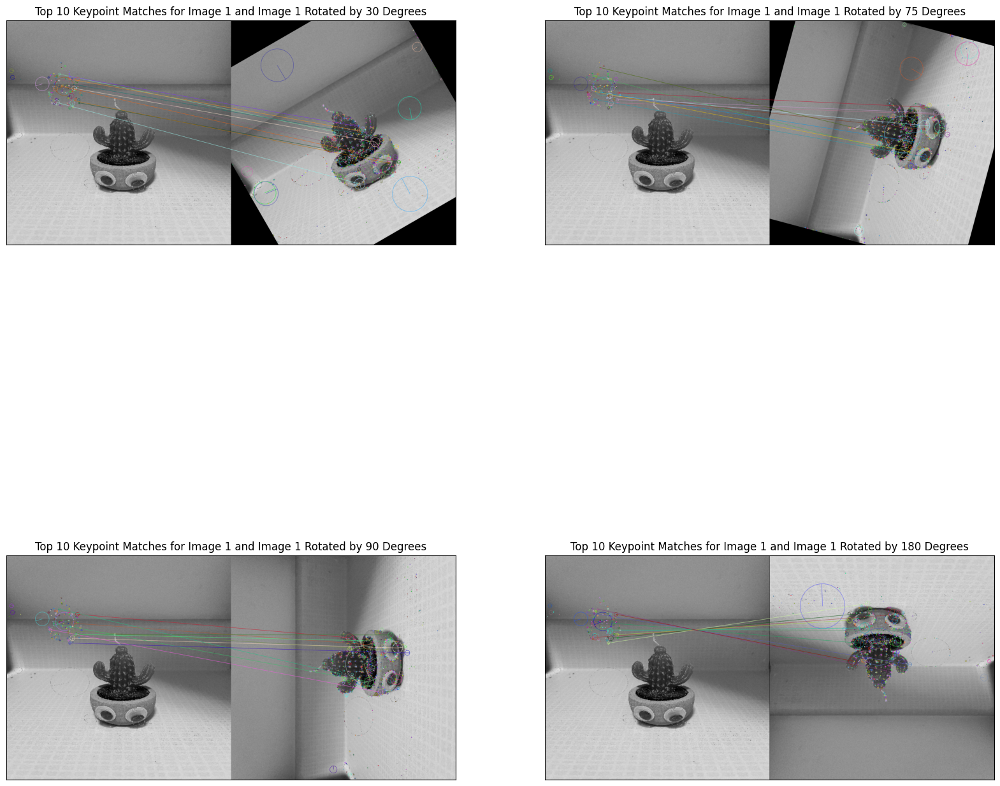

In [83]:
#Display the top ten matched keypoints for each pair of image_1 and a transformed image
image_1_30 = cv2.drawMatches(image_1,keypoints_l,image_1_rotated_30_degrees,keypoints_30,matches_30[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_75 = cv2.drawMatches(image_1,keypoints_l,image_1_rotated_75_degrees,keypoints_75,matches_75[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_90 = cv2.drawMatches(image_1,keypoints_l,image_1_rotated_90_degrees,keypoints_90,matches_90[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_180 = cv2.drawMatches(image_1,keypoints_l,image_1_rotated_180_degrees,keypoints_180,matches_180[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

#Display images
plt.figure(figsize=(20, 20))
plt.subplot(221), plt.imshow(image_1_30)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Rotated by 30 Degrees'), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(image_1_75)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Rotated by 75 Degrees'), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(image_1_90)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Rotated by 90 Degrees'), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(image_1_180)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Rotated by 180 Degrees'), plt.xticks([]), plt.yticks([])
plt.show()

### 6. Plot the matching distance for the top 100 matched keypoints. Plot the indices of the keypoints on the x-axis and the corresponding matching distance on the y-axis.


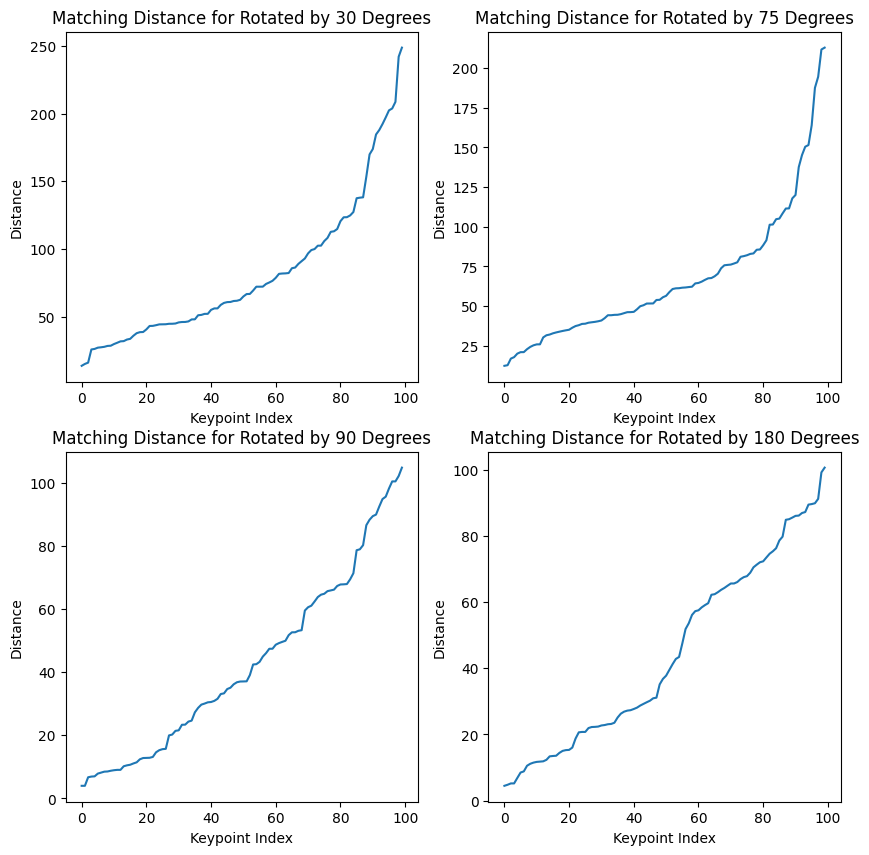

In [84]:
# a list of tuples containing the rotation degrees and the corresponding matches
rotations_and_matches = [
  (30, [match.distance for match in matches_30[:100]]),
  (75, [match.distance for match in matches_75[:100]]),
  (90, [match.distance for match in matches_90[:100]]),
  (180, [match.distance for match in matches_180[:100]])
]

plt.figure(figsize=(10, 10))

# iterate over the list to create the subplots
for i, (rotation, distances) in enumerate(rotations_and_matches, start=1):
  plt.subplot(220 + i)
  plt.plot(range(100), distances)
  plt.title(f'Matching Distance for Rotated by {rotation} Degrees')
  plt.xlabel('Keypoint Index')
  plt.ylabel('Distance')

plt.show()

### 7. Discuss the trend in the plotted results. What is the effect of increasing the angle of rotation on the matching distance? Explain.

From the four plots above we notice a very minor change in matched disctance as the angle of rotation increases. This can be explained by the fact that the SIFT algorithm is not impacted by rotation since it uses the gradient of the image to find keypoints and their descriptors. The gradient is not affected by rotation, so the matching distance remains constant. Hence even with larger rotations, many keypoints can still be correctly matched, although the matching distance may be larger.



#3  Image Stitching